# Kernel Non-Negative Tensor Factorization

In [45]:
%matplotlib inline

import matplotlib
import numpy as np
import scipy.io as sio #to load mat files
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

<h1> 1. Loading CMU Faces dataset </h1>

$\mathcal{X}\in\mathbb{R}_+^{30\times11\times21\times1024}$

In [46]:
sio.whosmat('../datasets/CMU(30x11x21x1024).mat')

[('FullTensor', (30, 11, 21, 1024), 'uint8')]

In [47]:
matTF = sio.loadmat('../datasets/CMU(30x11x21x1024).mat')#loading tensor of formatted faces' images

In [48]:
TF = matTF['FullTensor']
print TF.shape

(30, 11, 21, 1024)


Tensor Matrization:

$X\in\mathbb{R}_+^{6930\times1024}$

In [49]:
MF = np.reshape(TF,(30*11*21,1024))
print MF.shape

(6930, 1024)


<h2>1.1 Preprocessing incomplete data</h2>

In [50]:
rt_obinc = 0.4 # rate of objects incomplete
rt_incpob = 0.5 # rate of minimun elements (attributes or variables) incomplete for each object
idx_inc = np.sort(np.random.choice(MF.shape[0], MF.shape[0]*rt_obinc, replace=False))
idx_v = np.ones(MF.shape[0])
idx_v[idx_inc] = 0
idx_s = np.vstack((idx_v,idx_v)).repeat([1,MF.shape[1]-1],0).T
idx_com = np.arange(0,MF.shape[0]-1)
idx_com = np.delete(idx_com, idx_inc)

/opt/anaconda/envs/mindlabenv/lib/python2.7/site-packages/IPython/kernel/__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


In [51]:
idx_s2 = np.copy(idx_s) # idx_s2 could have partially incomplete objects
for i in idx_inc:
    idx_s2[i] = np.random.permutation(np.append(np.random.randint(2,size=MF.shape[1]*(1-rt_incpob)),np.zeros(MF.shape[1]*rt_incpob)))

#plt.pcolor(idx_s2)
#plt.colorbar()

/opt/anaconda/envs/mindlabenv/lib/python2.7/site-packages/IPython/kernel/__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


In [52]:
MF_ci = MF * idx_s2
MF_i = MF_ci[idx_inc]#subset with incomplete elements
MF_c = MF_ci[idx_com]#subset with complete elements
#plt.pcolor(MF_ci)
#plt.colorbar()

<h1>2. Kernel Completion Using Convex-NMF </h1>

In [53]:
import kernel as kernel
import pymf
from pymf.cnmf import CNMF 
from kcnmf import KCNMF 
import time

<h2>2.1 Tensorial Kernel for CMU Faces</h2>

 <ul style="list-style-type:disc">
  <li>Subject: SoftKernel $K_s$</li>
  <li>Pose: rbf kernel $K_p$</li>
  <li>Illumination: : rbf kernel $K_l$</li>
  <li>Image: linear kernel $K_i$</li>
</ul> 

In [11]:
#30x11x21x1024
eq = 1
diff = 0.3
poses = [175, 95, 93, 88, 10, 5, 180, 90, 80, 2, 170]
illuminations = np.arange(1,22)
TS = np.zeros((30,11,21))
for i in range(30):
    for j in range(len(poses)):
        for k in range(len(illuminations)):
            TS[i,j,k] = i
            
MS = np.reshape(TS,(30*11*21,1))

In [11]:
#Kernel for subject
Ks = np.zeros((len(idx_com),len(idx_com)))
for i in range(len(idx_com)):
    for j in range(len(idx_com)):
        if MS[i]==MS[j]:
            Ks[i,j] = eq
        else:
            Ks[i,j] = diff
print Ks.shape        
#plt.pcolor(Ks[350:,350:])
#plt.colorbar()

(4158, 4158)


In [14]:
TL_ = np.repeat(np.array(np.arange(1,22), ndmin = 2),11,axis=0)
TL = np.repeat(np.array(TL_,ndmin = 3),30,axis=0)
print TL.shape
ML = np.reshape(TL,(30*11*21,1))
print ML.shape
ML_c = ML[idx_com]
print ML_c.shape

(30, 11, 21)
(6930, 1)
(4158, 1)


In [21]:
#Kernel for illumination
sigma = 10
Kl = kernel._get_kernel(ML_c, ML_c,'rbf', gamma=(2*sigma)**-2)

(4158, 4158)


<matplotlib.colorbar.Colorbar instance at 0x7fce29f53638>

/opt/anaconda/envs/mindlabenv/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


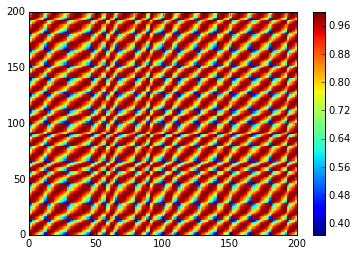

In [14]:
print Kl.shape
plt.pcolor(Kl[:200,:200])
plt.colorbar()

In [15]:
TP_ = np.repeat(np.array([175, 95, 93, 88, 10, 5, 180, 90, 80, 2, 170], ndmin = 2),21,axis=0)
TP = np.repeat(np.array(TP_.T,ndmin = 3),30,axis=0)
print TP.shape
MP = np.reshape(TP,(30*11*21,1))
print MP.shape
MP_c = MP[idx_com]
print MP_c.shape

(30, 11, 21)
(6930, 1)
(4158, 1)


In [133]:
#Kernel for pose
sigma = 40
Kp = kernel._get_kernel(MP_c, MP_c,'rbf', gamma=(2*sigma)**-2)

(4157, 4157)


<matplotlib.colorbar.Colorbar instance at 0x7f3919dcb368>

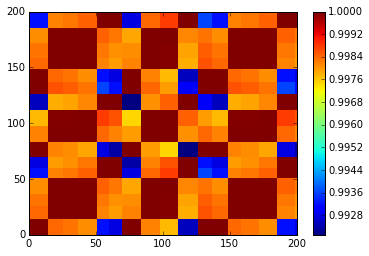

In [56]:
print Kp.shape
plt.pcolor(Kp[:200,:200])
plt.colorbar()

175 95 93 88 10 5 180 90 80 2 170


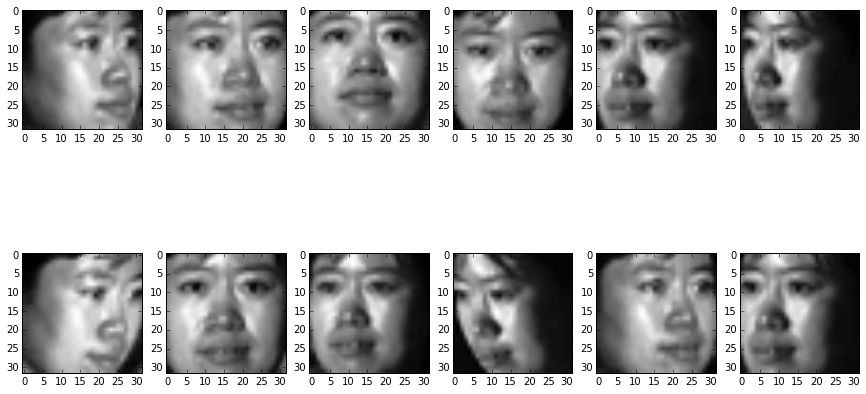

In [94]:
print TP[0,0,10],TP[0,1,10],TP[0,2,10],TP[0,3,10],TP[0,4,10],TP[0,5,10],TP[0,6,10],TP[0,7,10],TP[0,8,10],TP[0,9,10],TP[0,10,10]
f, axarr = plt.subplots(2, 6)
axarr[0,0].imshow( np.reshape(TF[0,0,10,:],(32,32)).T, cmap='Greys_r' )
axarr[0,1].imshow( np.reshape(TF[0,1,10,:],(32,32)).T, cmap='Greys_r' )
axarr[0,2].imshow( np.reshape(TF[0,2,10,:],(32,32)).T, cmap='Greys_r' )
axarr[0,3].imshow( np.reshape(TF[0,3,10,:],(32,32)).T, cmap='Greys_r' )
axarr[0,4].imshow( np.reshape(TF[0,4,10,:],(32,32)).T, cmap='Greys_r' )
axarr[0,5].imshow( np.reshape(TF[0,5,10,:],(32,32)).T, cmap='Greys_r' )
axarr[1,0].imshow( np.reshape(TF[0,6,10,:],(32,32)).T, cmap='Greys_r' )
axarr[1,1].imshow( np.reshape(TF[0,7,10,:],(32,32)).T, cmap='Greys_r' )
axarr[1,2].imshow( np.reshape(TF[0,8,10,:],(32,32)).T, cmap='Greys_r' )
axarr[1,3].imshow( np.reshape(TF[0,9,10,:],(32,32)).T, cmap='Greys_r' )
axarr[1,4].imshow( np.reshape(TF[0,10,10,:],(32,32)).T, cmap='Greys_r' )
axarr[1,5].imshow( np.reshape(TF[0,4,10,:],(32,32)).T, cmap='Greys_r' )
f.set_size_inches(15,8)

In [14]:
#Kernel for image
Ki = kernel._get_kernel(MF_c, MF_c,'linear')
print Ki.shape

(4157, 4157)


In [ ]:
#Kt = ks x Kp x kl x ki
#Kt = np.dot(np.dot(np.dot(Ks,Kp),Kl),Ki)
Kt = Ks*Kp*Kl*Ki
Kt.shape

In [ ]:
print Kt.shape
plt.pcolor(Kt[:400,:400])
plt.colorbar()

In [146]:
print Ks.shape,Kp.shape,Kl.shape,Ki.shape

(4158, 4158) (4158, 4158) (4158, 4158) (4158, 4158)


<h2>2.2 Computing Convex-NMF</h2>

$$\phi(X)\approx \phi(X)GH$$
$$\min||\phi(X) - \phi(X)GH||^2$$

$W = \phi(X)G$

<b>Parameters exploration:</b>

In [ ]:
#Exploring bases
bases = np.arange(2,Kt.shape[1]/32)
fopxt_c = np.ones(len(bases))
for idx,item in enumerate(bases):        
    cnmf_kt_c = CNMF(Kt, item)
    cnmf_kt_c.factorize(niter=10)
    fopxt_c[idx] = np.linalg.norm(Kt - np.dot(cnmf_kt_c.W,cnmf_kt_c.H))/np.linalg.norm(Kt)

min base  19


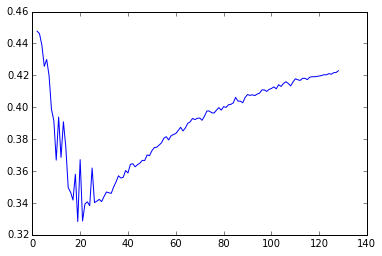

In [33]:
print "min base ", bases[np.argmin(fopxt_c)]
plt.plot(bases,fopxt_c)

In [35]:
#Exploring sigmas:
#Systematic experiments
import test_kcnmf
test_kcnmf.param_exp_sigma(MF_c,idx_com,19)

In [46]:
#Read Input
lines = np.loadtxt("/home/rajaquep/outcomes/cmu_faces_param_19oct2016.csv", comments="//", delimiter=";", skiprows=129, usecols=(1,2,3), unpack=False)

In [47]:
lines.shape
sigmav = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.5, 1e1, 1e2, 1e3, 1e4, 1e5 ]
sigmam = np.zeros((len(sigmav),len(sigmav)))
i,j = 0,0
for k in range(len(lines)):
    sigmam[i,j] = lines[k,2]
    j+=1
    if j==len(sigmav):
        i+=1
        j=0

min rse:  0.322393 with sigma illumination: 10000.0 sigma pose: 1000.0


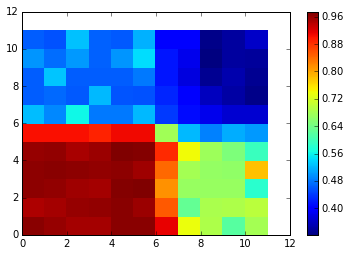

In [48]:
plt.pcolor(sigmam)
plt.colorbar()

print "min rse: ", min(lines[:,2]),"with sigma illumination:", lines[np.argmin(lines[:,2]),0], "sigma pose:", lines[np.argmin(lines[:,2]),1]


In [23]:
#Kernel for illumination
sigma = 10000.0
Kl = kernel._get_kernel(ML_c, ML_c,'rbf', gamma=(2*sigma)**-2)

In [24]:
#Kernel for pose
sigma = 1000.0
Kp = kernel._get_kernel(MP_c, MP_c,'rbf', gamma=(2*sigma)**-2)

In [25]:
#Kernel for image
Ki = kernel._get_kernel(MF_c, MF_c,'linear')
#print Ki.shape

In [26]:
#Kt = ks x Kp x kl x ki
#Kt = np.dot(np.dot(np.dot(Ks,Kp),Kl),Ki)
Kt = Ks*Kp*Kl*Ki
Kt.shape

(4157, 4157)

In [27]:
#Factorize
cnmf_kt_c = CNMF(Kt, num_bases=19)
cnmf_kt_c.factorize(niter=10)
print np.linalg.norm(Kt - np.dot(cnmf_kt_c.W,cnmf_kt_c.H))/np.linalg.norm(Kt)

0.36389900292


<h2>2.3 Completion: Finding $h_j$ to incomplete objects</h2>


Given an incomplete object $x_j$
$$\min_{h_j}||\phi(x_j)-\phi(X)Gh_j||^2$$
$$=\min_{h_j}h_j^TK(X,X)Gh_j - 2K(X,x_j)Gh_j$$
Using pseudo-inverse
$$h_j=(G^TK(X,X)G+\lambda I)^-1G^TK(X,x_j)$$

In [28]:
x = idx_inc[0]
print x

3


In [29]:
#complete object
#for each object x in idx_inc (MF[idx_inc] = MF_i)

#Kernel for illumination
sigma = 10000.0
Klx = kernel._get_kernel(ML_c, ML[x],'rbf', gamma=(2*sigma)**-2)
#Kernel for pose
sigma = 1000.0
Kpx = kernel._get_kernel(MP_c, MP[x],'rbf', gamma=(2*sigma)**-2)
#Kernel for image
Kix = kernel._get_kernel(MF_c, MF[x],'linear')
#Kernle for subject
#...

In [30]:
#Kernel for subject K(X_c,x_j)
j = x
Ksx = np.zeros((len(idx_com),1))
for i in range(len(idx_com)):
    if MS[i]==MS[j]: Ksx[i] = eq
    else: Ksx[i] = diff
print Ksx.shape

(4157, 1)


In [31]:
#Ktx = ksx x Kpx x klx x kix
#Ktx = np.dot(np.dot(np.dot(Ksx,Kpx),Klx),Kix)
Ktx= Ksx*Kpx*Klx*Kix


<i>(alternative 1)</i> If $Wh_j = x_j$, then $h_j = W^{+}x_j $. Without regularization

In [24]:
hj1 = np.dot(np.linalg.pinv(cnmf_kt_c.W),Ktx)

<i>(alternative 2)</i> $W^+ = (W^TW+\lambda I)^{-1}W^T$. When W has linealy independent columns. With regularization to guarante non singularity

In [25]:
lamb = 0
bases = 19
wpinv = np.dot( np.dot(cnmf_kt_c.W.T, cnmf_kt_c.W)+ lamb*np.identity(bases),cnmf_kt_c.W.T )

In [26]:
hj2 = np.dot(wpinv,Ktx)

In [27]:
Wpinv1 = np.linalg.pinv(cnmf_kt_c.W)

In [29]:
np.allclose(wpinv,Wpinv1)

False

In [31]:
print np.allclose( cnmf_kt_c.W, np.dot( np.dot(cnmf_kt_c.W, wpinv),cnmf_kt_c.W ) )
print np.allclose( cnmf_kt_c.W, np.dot( np.dot(cnmf_kt_c.W, Wpinv1),cnmf_kt_c.W ) )

False
True


<i>(alternative 3)</i> $W^+ = W^T(WW^T+\lambda I)^{-1}$. When $W$ has linealy independent rows. With regularization to guarante non singularity

In [32]:
lamb = 0
bases = 19
Wpinv2 = np.dot(cnmf_kt_c.W.T, np.linalg.inv( np.dot(cnmf_kt_c.W,cnmf_kt_c.W.T)+ lamb*np.identity(cnmf_kt_c.W.shape[0]) ) )

In [34]:
hj3 = np.dot(Wpinv2,Ktx)

In [35]:
print np.allclose( cnmf_kt_c.W, np.dot( np.dot(cnmf_kt_c.W, Wpinv2),cnmf_kt_c.W ) )
print np.allclose( cnmf_kt_c.W, np.dot( np.dot(cnmf_kt_c.W, Wpinv1),cnmf_kt_c.W ) )

False
True


<i>(alternative 4)</i> $h_j = (G^TK(X,X)G + \lambda I)^-1G^TK(X,x_j)$

In [83]:
lamb = 0
bases = 19
hj4 = np.dot( np.linalg.inv(np.dot(cnmf_kt_c.W.T, cnmf_kt_c.G)+ lamb*np.identity(bases)), np.dot(cnmf_kt_c.G.T, Ktx) )

In [99]:
np.allclose(np.dot(np.dot(np.linalg.inv(np.dot(cnmf_kt_c.W.T,cnmf_kt_c.G) + lamb*np.identity(bases)),cnmf_kt_c.W.T),cnmf_kt_c.G), np.identity(bases))

True

In [104]:
#lamb = 0
np.allclose(np.dot(np.linalg.inv(np.dot(cnmf_kt_c.W.T,cnmf_kt_c.G) + lamb*np.identity(bases)), np.dot(np.dot(cnmf_kt_c.G.T,Kt),cnmf_kt_c.G)), np.identity(bases))

True

In [106]:
lamb= 1e-4
np.linalg.norm(np.dot(np.linalg.inv(np.dot(cnmf_kt_c.W.T,cnmf_kt_c.G) + lamb*np.identity(bases)), np.dot(np.dot(cnmf_kt_c.G.T,Kt),cnmf_kt_c.G)) - np.identity(bases))

1.159681313250205e-07

In [117]:
npi =[]
for lamb in np.linspace(1e-4,1e-10,100):
    npi.append(np.linalg.norm(np.dot(np.linalg.inv(np.dot(cnmf_kt_c.W.T,cnmf_kt_c.G) + lamb*np.identity(bases)), np.dot(np.dot(cnmf_kt_c.G.T,Kt),cnmf_kt_c.G)) - np.identity(bases)))

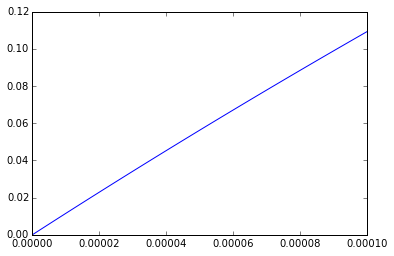

In [118]:
plt.plot(np.linspace(1e-4,1e-10,100),npi)

In [84]:
hj4.shape

(19, 1)

Compute $h_j$ for each incomplete object $x_j$:

In [ ]:
lamb = 1e-5
bases = 19
sigmal = 10000.0
sigmap = 1000.0
H1_i = np.zeros((bases, len(idx_inc)))
H2_i = np.zeros((bases, len(idx_inc)))
H3_i = np.zeros((bases, len(idx_inc)))
H4_i = np.zeros((bases, len(idx_inc)))
k=0
for j in idx_inc:
    #Kernel for illumination
    Klx = kernel._get_kernel(ML_c, ML[j],'rbf', gamma=(2*sigmal)**-2)
    #Kernel for pose
    Kpx = kernel._get_kernel(MP_c, MP[j],'rbf', gamma=(2*sigmap)**-2)
    #Kernel for image
    Kix = kernel._get_kernel(MF_c, MF_ci[j],'linear')
    #Kix = kernel._get_kernel(MF_c, MF[j],'linear')
    #Kernle for subject
    #...
    Ksx = np.zeros((len(idx_com),1))
    for i in range(len(idx_com)):
        if MS[i]==MS[j]: Ksx[i] = eq
        else: Ksx[i] = diff
    #print Ksx.shape  
    Ktx = Ksx*Kpx*Klx*Kix
    H4_i[:,k] = np.squeeze(np.dot( np.linalg.inv(np.dot(cnmf_kt_c.W.T, cnmf_kt_c.G)+ lamb*np.identity(bases)), np.dot(cnmf_kt_c.G.T, Ktx) ))
    H3_i[:,k] = np.squeeze(np.dot(np.dot(cnmf_kt_c.W.T, np.linalg.inv( np.dot(cnmf_kt_c.W,cnmf_kt_c.W.T)+ lamb*np.identity(cnmf_kt_c.W.shape[0]) ) ),Ktx))
    H2_i[:,k] = np.squeeze(np.dot(np.dot( np.dot(cnmf_kt_c.W.T, cnmf_kt_c.W)+ lamb*np.identity(bases),cnmf_kt_c.W.T ),Ktx))
    H1_i[:,k] = np.squeeze(np.dot(np.linalg.pinv(cnmf_kt_c.W),Ktx))
    k+=1

In [ ]:
Ktx.shape

In [20]:
#Factorization over the dataset without incompletion
Ks_ = kernel.softKernel(MF, 0.3, 1, 30)#subject
#Kernel for illumination
sigma = 10000.0
Kl_ = kernel._get_kernel(ML, ML,'rbf', gamma=(2*sigma)**-2)
#Kernel for pose
sigma = 1000.0
Kp_ = kernel._get_kernel(MP, MP,'rbf', gamma=(2*sigma)**-2)
#Kernel for image
Ki_ = kernel._get_kernel(MF, MF,'linear')
Kt_ = Ks_*Kp_*Kl_*Ki_
#Factorize
cnmf_kt = CNMF(Kt_, num_bases=19)
cnmf_kt.factorize(niter=10)
print np.linalg.norm(Kt_ - np.dot(cnmf_kt.W,cnmf_kt.H))/np.linalg.norm(Kt_)

0.3441742413


In [56]:
print np.linalg.norm(cnmf_kt.H[:,idx_inc]-H_i)

19.8098069853


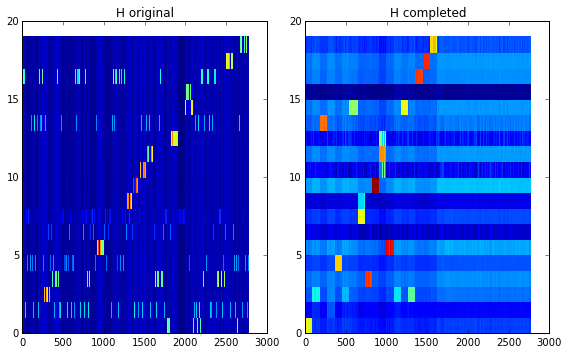

In [57]:
f, axarr = plt.subplots(1, 2)
axarr[0].pcolor(cnmf_kt.H[:,idx_inc])
axarr[0].set_title('H original')
axarr[1].pcolor(H_i)
axarr[1].set_title('H completed')
f.set_size_inches(8,5)
f.tight_layout()

In [182]:
np.linalg.norm(H_i)

12.078689367730354

<h2>2.4 Solve the pre-image problem</h2>

Given an incomplete object $x_j$
$$\phi(x_j) \approx \phi(X)Gh_j$$
The preimage problem consists of find $x*$ such that $\phi(x*) \approx \phi(x_j)$ or $$\phi(x*) \approx \phi(X)Gh_j$$

In [22]:
from kernelFaces import KernelFaces as KF

In [23]:
kf = KF(MF, idx_com)

In [24]:
print np.dot(cnmf_kt_c.W, H_i[:,0]).shape

(4158,)


In [25]:
sigmal = 10000.0
sigmap = 1000.0
#Pre-image reconstruction with H of completed objects
H_i_ref = cnmf_kt.H[:,idx_inc]
num_atts = MF_ci.shape[1]
num_bases = 19
MFpreim_ci = np.copy(MF_ci)
tic = time.clock()#get start time
for j in range(len(idx_inc)):
    print 'Compute pre-image for object',idx_inc[j]
    alpha = np.dot(cnmf_kt_c.W, H_i_ref[:,j]) #np.mean(cnmf_kg.H,0)
    MFpreim_ci[idx_inc[j]], trainErrorskl = kf.preimage_faces(MF_c, alpha, idx_inc[j],'cmu_softxrbfx3xlinear', sigmal,sigmap)    
toc = time.clock()#get final time
print 'Time: ',toc - tic

Compute pre-image for object 3
Compute pre-image for object 4
Compute pre-image for object 6
Compute pre-image for object 7
Compute pre-image for object 8
Compute pre-image for object 11
Compute pre-image for object 12
Compute pre-image for object 13
Compute pre-image for object 17
Compute pre-image for object 18
Compute pre-image for object 20
Compute pre-image for object 21
Compute pre-image for object 23
Compute pre-image for object 25
Compute pre-image for object 32
Compute pre-image for object 34
Compute pre-image for object 35
Compute pre-image for object 36
Compute pre-image for object 37
Compute pre-image for object 39
Compute pre-image for object 40
Compute pre-image for object 41
Compute pre-image for object 45
Compute pre-image for object 50
Compute pre-image for object 52
Compute pre-image for object 54
Compute pre-image for object 57
Compute pre-image for object 58
Compute pre-image for object 59
Compute pre-image for object 60
Compute pre-image for object 62
Compute pre-i

In [58]:
sigmal = 10000.0
sigmap = 1000.0
#Pre-image reconstruction
num_atts = MF_ci.shape[1]
num_bases = 19
MFpreim_ci = np.copy(MF_ci)
tic = time.clock()#get start time
for j in range(len(idx_inc)):
    print 'Compute pre-image for object',idx_inc[j]
    alpha = np.dot(cnmf_kt_c.W, H_i[:,j]) #np.mean(cnmf_kg.H,0)
    MFpreim_ci[idx_inc[j]], trainErrorskl = kf.preimage_faces(MF_c, alpha, idx_inc[j],'cmu_softxrbfx3xlinear', sigmal,sigmap)    
toc = time.clock()#get final time
print 'Time: ',toc - tic

Compute pre-image for object 3
Compute pre-image for object 4
Compute pre-image for object 6
Compute pre-image for object 7
Compute pre-image for object 8
Compute pre-image for object 11
Compute pre-image for object 12
Compute pre-image for object 13
Compute pre-image for object 17
Compute pre-image for object 18
Compute pre-image for object 20
Compute pre-image for object 21
Compute pre-image for object 23
Compute pre-image for object 25
Compute pre-image for object 32
Compute pre-image for object 34
Compute pre-image for object 35
Compute pre-image for object 36
Compute pre-image for object 37
Compute pre-image for object 39
Compute pre-image for object 40
Compute pre-image for object 41
Compute pre-image for object 45
Compute pre-image for object 50
Compute pre-image for object 52
Compute pre-image for object 54
Compute pre-image for object 57
Compute pre-image for object 58
Compute pre-image for object 59
Compute pre-image for object 60
Compute pre-image for object 62
Compute pre-i

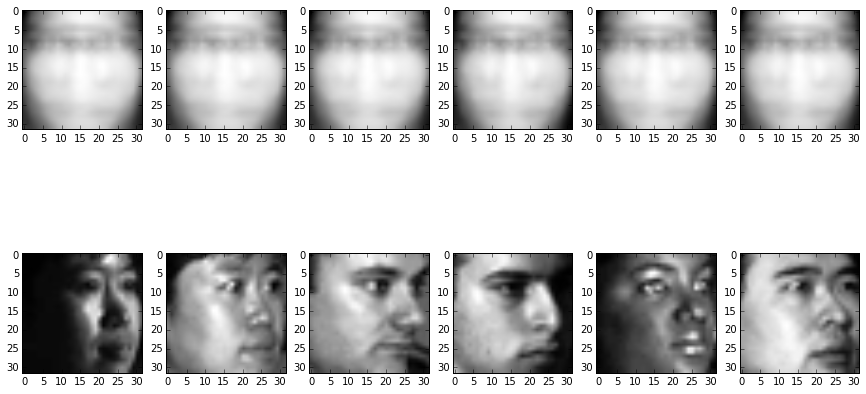

In [60]:
f, axarr = plt.subplots(2, 6)
axarr[0,0].imshow( np.reshape(MFpreim_ci[idx_inc[0],:],(32,32)).T, cmap='Greys_r' )
axarr[0,1].imshow( np.reshape(MFpreim_ci[idx_inc[10],:],(32,32)).T, cmap='Greys_r' )
axarr[0,2].imshow( np.reshape(MFpreim_ci[idx_inc[100],:],(32,32)).T, cmap='Greys_r' )
axarr[0,3].imshow( np.reshape(MFpreim_ci[idx_inc[1000],:],(32,32)).T, cmap='Greys_r' )
axarr[0,4].imshow( np.reshape(MFpreim_ci[idx_inc[2000],:],(32,32)).T, cmap='Greys_r' )
axarr[0,5].imshow( np.reshape(MFpreim_ci[idx_inc[2100],:],(32,32)).T, cmap='Greys_r' )
axarr[1,0].imshow( np.reshape(MF[idx_inc[0],:],(32,32)).T, cmap='Greys_r' )
axarr[1,1].imshow( np.reshape(MF[idx_inc[10],:],(32,32)).T, cmap='Greys_r' )
axarr[1,2].imshow( np.reshape(MF[idx_inc[100],:],(32,32)).T, cmap='Greys_r' )
axarr[1,3].imshow( np.reshape(MF[idx_inc[1000],:],(32,32)).T, cmap='Greys_r' )
axarr[1,4].imshow( np.reshape(MF[idx_inc[2000],:],(32,32)).T, cmap='Greys_r' )
axarr[1,5].imshow( np.reshape(MF[idx_inc[2100],:],(32,32)).T, cmap='Greys_r' )
f.set_size_inches(15,8)

In [55]:
print np.linalg.norm(np.reshape(MFpreim_ci[idx_inc[0],:],(32,32)) - np.reshape(MFpreim_ci[idx_inc[2000],:],(32,32)))
print np.linalg.norm(np.reshape(MF[idx_inc[2000],:],(32,32)) - np.reshape(MFpreim_ci[idx_inc[2000],:],(32,32)))

45.9672971989
2108.12013317


In [ ]:
#Systematic experiments
import test_kcnmf
test_kcnmf.test_cmu1(MF, sigmal = 10000.0, sigmap = 1000.0, bases = 19)

Compute pre-image for object 1
Compute pre-image for object 2
Compute pre-image for object 3
Compute pre-image for object 4
Compute pre-image for object 8
Compute pre-image for object 10
Compute pre-image for object 16
Compute pre-image for object 18
Compute pre-image for object 27
Compute pre-image for object 31
Compute pre-image for object 36
Compute pre-image for object 37
Compute pre-image for object 45
Compute pre-image for object 48
Compute pre-image for object 55
Compute pre-image for object 66
Compute pre-image for object 80
Compute pre-image for object 83
Compute pre-image for object 93
Compute pre-image for object 97
Compute pre-image for object 109
Compute pre-image for object 136
Compute pre-image for object 168
Compute pre-image for object 170
Compute pre-image for object 173
Compute pre-image for object 178
Compute pre-image for object 182
Compute pre-image for object 189
Compute pre-image for object 206
Compute pre-image for object 229
Compute pre-image for object 230
Co

In [33]:
#Read Input
lines2 = np.loadtxt("/home/rajaquep/outcomes/cmu_faces_26oct2016.csv", comments="//", delimiter=";", skiprows=2, usecols=(1,2,3,4,5,6), unpack=False)

In [39]:
missing_rates = [0.1, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.92, 0.94, 0.96, 0.98]

rse_cmu1_mean = []
for i in range(len(missing_rates)):
    rse_cmu1_mean.append( np.min(lines2[np.arange(i,lines2.shape[0],11),4]) )

In [40]:
#rse STDC
rse_stdc = [.1282, .1878, .2469, .2652, .3087, .2177, .4852, .6168, .7513, .8587, .9324]

In [45]:
#Read Input approach 1 to compare
lines = np.loadtxt("/home/rajaquep/outcomes/cmu_faces_12sep2016.csv", comments="//", delimiter=";", skiprows=1, usecols=(1,2,3,4,5), unpack=False)
rse_rbf = lines[np.arange(1,lines.shape[0],3),4]#rbf kernel
rse_rbf_mean = []
for i in range(len(missing_rates)):
    rse_rbf_mean.append( np.min(rse_rbf[np.arange(i,rse_rbf.shape[0],11)]) )

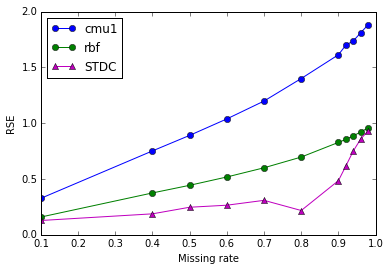

In [49]:
plt.plot(missing_rates,rse_cmu1_mean,'-ob',label='cmu1')
plt.plot(missing_rates,rse_rbf_mean,'-og',label='rbf')
#plt.plot(missing_rates,rse_linxrbf_mean,'-or',label='linxrbf')
#plt.plot(missing_rates,rse_softxlinxrbf_mean,'-oy',label='softxlinxrbf')
plt.plot(missing_rates,rse_stdc,'-^m',label='STDC')
plt.legend(loc=2)
plt.ylabel('RSE')
plt.xlabel('Missing rate')

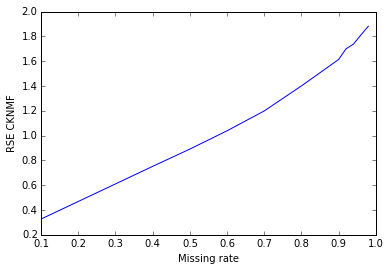

In [50]:

rse_fs_mean = []
for i in range(len(missing_rates)):
    rse_fs_mean.append( np.min(lines2[np.arange(i,lines2.shape[0],11),5]) )
    
plt.plot(missing_rates,rse_cmu1_mean)
plt.ylabel('RSE CKNMF')
plt.xlabel('Missing rate')

<h2>3.1 Tensorial Kernel for CMU Faces</h2>

 <ul style="list-style-type:disc">
  <li>Subject: rbf kernel $K_s$</li>
  <li>Pose: rbf kernel $K_p$</li>
  <li>Illumination: : rbf kernel $K_l$</li>
  <li>Image: rbf kernel $K_i$</li>
</ul> 

In [ ]:
#Exploring sigmas:
#Systematic experiments
import test_kcnmf
test_kcnmf.param_exp_sigma3(MF,30,.4,4)

In [54]:
#Read Input
lines = np.loadtxt("/home/rajaquep/outcomes/cmu_faces_param_8nov2016.csv", comments="//", delimiter=",", skiprows=1, usecols=(1,2,3,4), unpack=False)

In [70]:
sigmav = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.5, 1e1, 1e2, 1e3, 1e4, 1e5 ]
lines[:,0]
print "min rse: ", min(lines[:,3]),"with sigma illumination:", lines[np.argmin(lines[:,3]),0], "sigma pose:", lines[np.argmin(lines[:,3]),1], "sigma image:", lines[np.argmin(lines[:,3]),2]

min rse:  0.29876 with sigma illumination: 100.0 sigma pose: 1000.0 sigma image: 10000.0


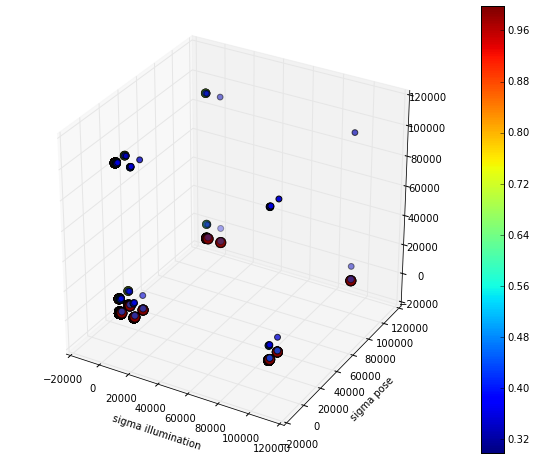

In [68]:
#draw sigma exploration
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10,8))
ax = fig.gca(projection='3d')
sc = ax.scatter(
           lines[:,0], lines[:,1], lines[:,2],  # data
           c=lines[:,3],                            # marker colour
           #marker='o',                                # marker shape
           s=(lines[:,3]*100)                                 # marker size
           )
plt.xlabel('sigma illumination')
plt.ylabel('sigma pose')
plt.colorbar(sc)
plt.show()                                            # render the plot

In [10]:
#30x11x21x1024
eq = 1
diff = 0.7
poses = [175, 95, 93, 88, 10, 5, 180, 90, 80, 2, 170]
illuminations = np.arange(1,22)
TS = np.zeros((30,11,21))
for i in range(30):
    for j in range(len(poses)):
        for k in range(len(illuminations)):
            TS[i,j,k] = i
            
MS = np.reshape(TS,(30*11*21,1))


In [11]:
#Kernel for subject
Ks = np.zeros((len(idx_com),len(idx_com)))
for i in range(len(idx_com)):
    for j in range(len(idx_com)):
        if MS[i]==MS[j]:
            Ks[i,j] = eq
        else:
            Ks[i,j] = diff
print Ks.shape        
#plt.pcolor(Ks[350:,350:])
#plt.colorbar()

(4158, 4158)


In [64]:
#Kernel for subject rbf (2)
sigma = 10.05
Ks = kernel._get_kernel(MS[idx_com], MS[idx_com],'rbf', gamma=(2*sigma)**-2)

/opt/anaconda/envs/mindlabenv/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


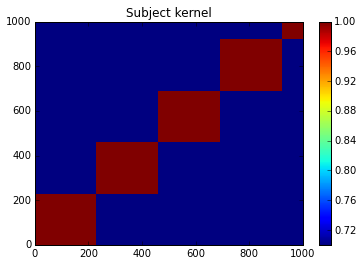

In [12]:
plt.pcolor(Ks[:1000,:1000])
plt.colorbar()
plt.title('Subject kernel')

In [16]:
#Kernel for illumination
sigma = 10.5
Kl = kernel._get_kernel(ML_c, ML_c,'rbf', gamma=(2*sigma)**-2)

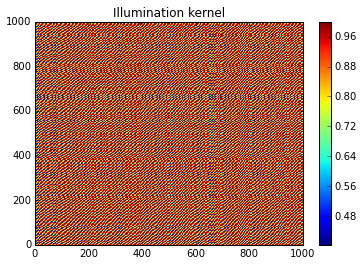

In [17]:
plt.pcolor(Kl[:1000,:1000])
plt.colorbar()
plt.title('Illumination kernel')

In [18]:
#Kernel for pose
sigma = 100.5
Kp = kernel._get_kernel(MP_c, MP_c,'rbf', gamma=(2*sigma)**-2)

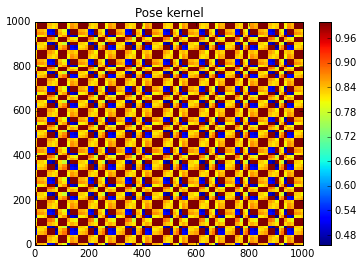

In [19]:
plt.pcolor(Kp[:1000,:1000])
plt.colorbar()
plt.title('Pose kernel')

In [20]:
#Kernel for image
sigma = 2500.0
Ki = kernel._get_kernel(MF_c, MF_c,'rbf', gamma=(2*sigma)**-2)
#print Ki.shape

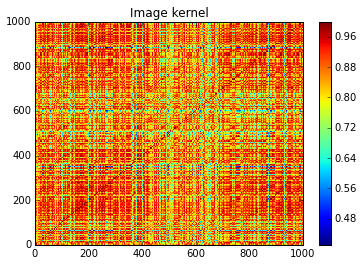

In [21]:
plt.pcolor(Ki[:1000,:1000])
plt.colorbar()
plt.title('Image kernel')

In [22]:
#Kt = ks x Kp x kl x ki
#Kt = np.dot(np.dot(np.dot(Ks,Kp),Kl),Ki)
Kt = Ks*Kp*Kl*Ki
Kt.shape

(4158, 4158)

In [ ]:
f, axarr = plt.subplots(6, 6)
stp = 1000
for i in range(6):
    for j in range(6):
        axarr[5-i,j].pcolor(Kt[i*stp:i*stp+stp,j*stp:j*stp+stp])
        axarr[5-i,j].set_title(str(i*stp)+':'+str(i*stp+stp)+'/'+str(j*stp)+':'+str(j*stp+stp))
        #axarr[4-i,j].xlabel(str(j*stp)+':'+str(j*stp+stp))
        #axarr[4-i,j].ylabel(str(j*stp)+':'+str(j*stp+stp))


f.set_size_inches(12,12)
f.tight_layout()
#plt.colorbar()

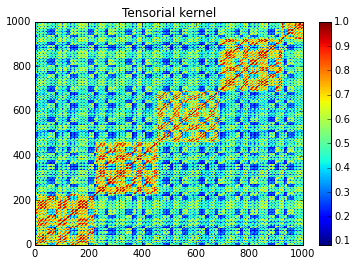

In [23]:
plt.pcolor(Kt[:1000,:1000])
plt.colorbar()
plt.title('Tensorial kernel')

Hey


In [24]:
#Factorize
tic = time.clock()#get start time
cnmf_kt_c = KCNMF(Kt, num_bases=30)
cnmf_kt_c.factorize(niter=10)
print np.linalg.norm(Kt - np.dot(cnmf_kt_c.W,cnmf_kt_c.H))/np.linalg.norm(Kt)
toc = time.clock()#get final time
print 'Time: ', toc - tic

0.177429301832
Time:  67.035141


In [23]:
#Factorize
_cnmf_kt_c = CNMF(Kt, num_bases=100)
_cnmf_kt_c.factorize(niter=10)
print np.linalg.norm(Kt - np.dot(cnmf_kt_c.W,cnmf_kt_c.H))/np.linalg.norm(Kt)

0.366124827539


In [22]:
from OKMF import OKMF #Online Kernel Matrix Factorization
#Esteban algorithm 
Gamma = 0.01
Lambda = 0.0001
Alpha = 0.3
sigma = 2**-2
epochs = 3
ok = OKMF(4158,19,10,epochs,Gamma,Lambda,Alpha,'precomputed',gamma=sigma)
ok.fit(Kt,calculateErrors=True)
print np.linalg.norm(Kt - np.dot(ok.W,ok.H))/np.linalg.norm(Kt)

0.998384634483


Using mask to discard incomplete pixels at prediction

46161.0 46161.0
(6930, 1024)
(4158, 1024)


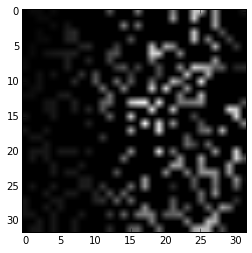

In [40]:
#plt.imshow( np.reshape(MF_ci[idx_inc[8],:],(32,32)).T, cmap='Greys_r' )
rm = np.random.randint(5, size=1024)
print np.dot(MF_ci[idx_inc[8]], rm), np.dot(MF_ci[idx_inc[8]], rm*idx_s2[idx_inc[8]])
print idx_s2.shape
MF_c_mask = idx_s2[idx_inc[8]]*MF_c
print MF_c_mask.shape
#plt.imshow( np.reshape(MF_c_mask[1,:],(32,32)).T, cmap='Greys_r' )

<h2>3.2 Completion: Finding $h_j$ to incomplete objects</h2>


Given an incomplete object $x_j$
$$\min_{h_j}||\phi(x_j)-\phi(X)Gh_j||^2$$
$$=\min_{h_j}h_j^TK(X,X)Gh_j - 2K(X,x_j)Gh_j$$
Using pseudo-inverse
$$h_j=(G^TK(X,X)G+\lambda I)^-1G^TK(X,x_j)$$

Compute $h_j$ for each incomplete object $x_j$:

In [41]:
lamb = 1e-10
bases = 30#19

mask = 1

sigmas = 0.05
sigmal = 10.5 #100.0#1.6#
sigmap = 100.5#1000.0#4.5#
sigmai = 1000.0#10000.0#1000#
#H1_i = np.zeros((bases, len(idx_inc)))
#H2_i = np.zeros((bases, len(idx_inc)))
#H3_i = np.zeros((bases, len(idx_inc)))
H4_i = np.zeros((bases, len(idx_inc)))
#H5_i = np.zeros((bases, len(idx_inc)))
k=0
#auxpi5 = np.linalg.inv(np.dot(ok.W.T, ok.W)+ lamb*np.identity(bases))
auxpi4 = np.linalg.inv(np.dot(cnmf_kt_c.W.T, cnmf_kt_c.G)+ lamb*np.identity(bases))
#auxpi3 = np.dot(cnmf_kt_c.W.T, np.linalg.inv( np.dot(cnmf_kt_c.W,cnmf_kt_c.W.T)+ lamb*np.identity(cnmf_kt_c.W.shape[0]) ) )
#auxpi2 = np.dot( np.dot(cnmf_kt_c.W.T, cnmf_kt_c.W)+ lamb*np.identity(bases),cnmf_kt_c.W.T )
#auxpi1 = np.linalg.pinv(cnmf_kt_c.W)
for j in idx_inc:
    #Ksx = kernel._get_kernel(MS[j], MS[j],'rbf', gamma=(2*sigmas)**-2)
    #Kernel for illumination
    Klx = kernel._get_kernel(ML_c, ML[j],'rbf', gamma=(2*sigmal)**-2)
    #Kernel for pose
    Kpx = kernel._get_kernel(MP_c, MP[j],'rbf', gamma=(2*sigmap)**-2)
    #Kernel for image
    #With mask
    if mask == 1:
        Kix = kernel._get_kernel(idx_s2[j]*MF_c, MF_ci[j],'rbf', gamma=(2*sigmap)**-2)
    else:
        Kix = kernel._get_kernel(MF_c, MF_ci[j],'rbf', gamma=(2*sigmap)**-2)
    #Kix = kernel._get_kernel(MF_c, MF[j],'linear')
    #Kernle for subject
    #...
    Ksx = np.zeros((len(idx_com),1))
    for i in range(len(idx_com)):
        if MS[i]==MS[j]: Ksx[i] = eq
        else: Ksx[i] = diff
    #print Ksx.shape  
    Ktx = Ksx*Kpx*Klx*Kix
    #H5_i[:,k] = np.squeeze(np.dot(auxpi5, np.dot(ok.W.T, Ktx) ))
    H4_i[:,k] = np.squeeze(np.dot(auxpi4, np.dot(cnmf_kt_c.G.T, Ktx) ))
    #H3_i[:,k] = np.squeeze(np.dot(auxpi3,Ktx))
    #H2_i[:,k] = np.squeeze(np.dot(auxpi2,Ktx))
    #H1_i[:,k] = np.squeeze(np.dot(auxpi1,Ktx))
    k+=1

In [35]:
#compute reference H*=H5
#Kernel for subject incompletes
Ksi = np.zeros((len(idx_inc),len(idx_inc)))
for i in range(len(idx_inc)):
    for j in range(len(idx_inc)):
        if MS[i]==MS[j]:
            Ksi[i,j] = eq
        else:
            Ksi[i,j] = diff
print Ksi.shape   
#Kernel for illumination incompletes
ML_i = ML[idx_inc]
sigma = 100.0
Kli = kernel._get_kernel(ML_i, ML_i,'rbf', gamma=(2*sigma)**-2)
#Kernel for pose
MP_i = MP[idx_inc]
sigma = 1000.0
Kpi = kernel._get_kernel(MP_i, MP_i,'rbf', gamma=(2*sigma)**-2)
#Kernel for image
sigma = 10000.0
Kii = kernel._get_kernel(MF[idx_inc], MF[idx_inc],'rbf', gamma=(2*sigma)**-2)
#print Ki.shape
#Kt = ks x Kp x kl x ki
#Kti = np.dot(np.dot(np.dot(Ksi,Kpi),Kli),Kii)
Kti = Ksi*Kpi*Kli*Kii
print Kti.shape
cnmf_kt_i = CNMF(Kti, num_bases=19)
cnmf_kt_i.factorize(niter=10)
print np.linalg.norm(Kti - np.dot(cnmf_kt_i.W,cnmf_kt_i.H))/np.linalg.norm(Kti)
H5_i = cnmf_kt_i.H
print cnmf_kt_i.H.shape

(2772, 2772)
(2772, 2772)
0.0965418429054
(19, 2772)


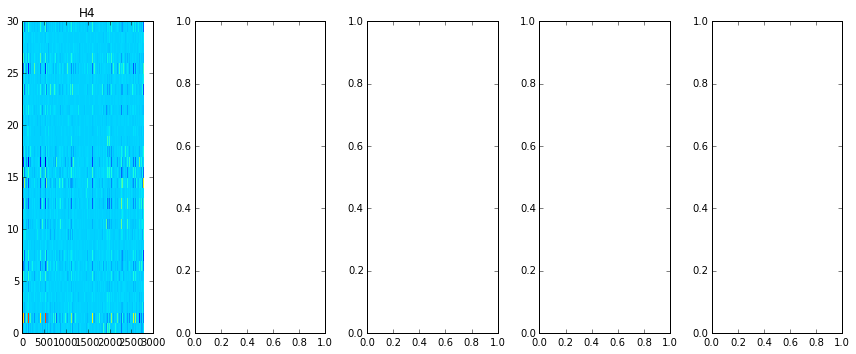

In [42]:
f, axarr = plt.subplots(1, 5)
axarr[0].pcolor(H4_i)
axarr[0].set_title('H4')
#axarr[1].pcolor(H3_i)
#axarr[1].set_title('H3')
#axarr[2].pcolor(H2_i)
#axarr[2].set_title('H2')
#axarr[3].pcolor(H1_i)
#axarr[3].set_title('H1')
#axarr[4].pcolor(H5_i)
#axarr[4].set_title('H5')
f.set_size_inches(12,5)
f.tight_layout()

In [40]:
Ktx

array([[  1.80651966e-61],
       [  2.69866781e-40],
       [  3.77395307e-78],
       ..., 
       [  1.57794570e-37],
       [  5.48417167e-71],
       [  2.87305106e-70]])

<h2>2.4 Solve the pre-image problem</h2>

Given an incomplete object $x_j$
$$\phi(x_j) \approx \phi(X)Gh_j$$
The preimage problem consists of find $x*$ such that $\phi(x*) \approx \phi(x_j)$ or $$\phi(x*) \approx \phi(X)Gh_j$$

In [43]:
sigmas = 10.05#0.05
sigmal = 100.0#1.6#
sigmap = 1000.0#4.5#
sigmai = 10000.0#1000#

#Pre-image reconstruction
num_atts = MF_ci.shape[1]
num_bases = 30#19
MFpreim_ci = np.copy(MF_ci)
tic = time.clock()#get start time
for j in range(len(idx_inc)):
    print 'Compute pre-image for object',idx_inc[j]
    alpha = np.dot(cnmf_kt_c.G, H4_i[:,j]) #np.mean(cnmf_kg.H,0)    
    #alpha = np.dot(ok.W, H5_i[:,j])
    try:
        MFpreim_ci[idx_inc[j]], trainErrorskl = kernel.preimage(MF_c, alpha, 'rbf', gamma=(2*sigmas)**-2+(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)
    except:
        print 'Problems computing preimage', j
        continue
    
toc = time.clock()#get final time
print 'Time: ',toc - tic

Compute pre-image for object 0
Compute pre-image for object 2
Compute pre-image for object 3
Compute pre-image for object 5
Compute pre-image for object 6
Compute pre-image for object 7
Compute pre-image for object 10
Compute pre-image for object 12
Compute pre-image for object 15
Compute pre-image for object 19
Compute pre-image for object 22
Compute pre-image for object 26
Compute pre-image for object 28
Compute pre-image for object 29
Compute pre-image for object 30
Compute pre-image for object 32
Compute pre-image for object 33
Compute pre-image for object 35
Compute pre-image for object 36
Compute pre-image for object 38
Compute pre-image for object 39
Compute pre-image for object 43
Compute pre-image for object 46
Compute pre-image for object 47
Compute pre-image for object 51
Compute pre-image for object 55
Compute pre-image for object 60
Compute pre-image for object 61
Compute pre-image for object 67
Compute pre-image for object 68
Compute pre-image for object 70
Compute pre-im

Cualitative results:

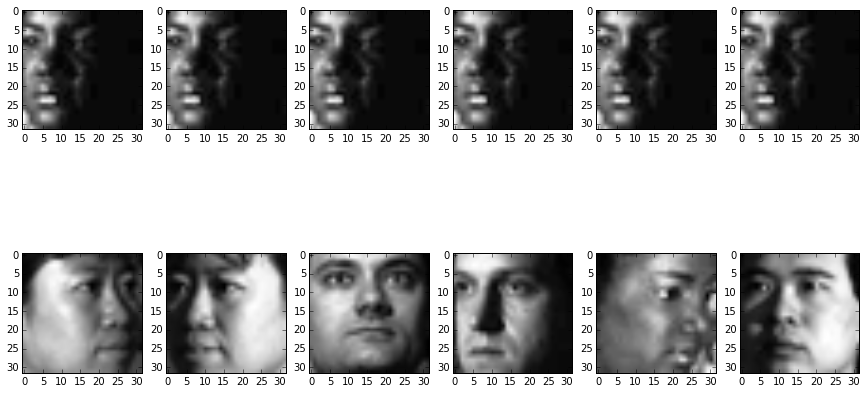

In [44]:
f, axarr = plt.subplots(2, 6)
axarr[0,0].imshow( np.reshape(MFpreim_ci[idx_inc[8],:],(32,32)).T, cmap='Greys_r' )
axarr[0,1].imshow( np.reshape(MFpreim_ci[idx_inc[36],:],(32,32)).T, cmap='Greys_r' )
axarr[0,2].imshow( np.reshape(MFpreim_ci[idx_inc[100],:],(32,32)).T, cmap='Greys_r' )
axarr[0,3].imshow( np.reshape(MFpreim_ci[idx_inc[600],:],(32,32)).T, cmap='Greys_r' )
axarr[0,4].imshow( np.reshape(MFpreim_ci[idx_inc[2000],:],(32,32)).T, cmap='Greys_r' )
axarr[0,5].imshow( np.reshape(MFpreim_ci[idx_inc[2100],:],(32,32)).T, cmap='Greys_r' )
axarr[1,0].imshow( np.reshape(MF[idx_inc[8],:],(32,32)).T, cmap='Greys_r' )
axarr[1,1].imshow( np.reshape(MF[idx_inc[36],:],(32,32)).T, cmap='Greys_r' )
axarr[1,2].imshow( np.reshape(MF[idx_inc[100],:],(32,32)).T, cmap='Greys_r' )
axarr[1,3].imshow( np.reshape(MF[idx_inc[600],:],(32,32)).T, cmap='Greys_r' )
axarr[1,4].imshow( np.reshape(MF[idx_inc[2000],:],(32,32)).T, cmap='Greys_r' )
axarr[1,5].imshow( np.reshape(MF[idx_inc[2100],:],(32,32)).T, cmap='Greys_r' )
f.set_size_inches(15,8)
f.savefig('/home/rajaquep/outcomes/foo.png')


<h3>2.4.1 Validating the pre-image method</h3>

Image incomplete: 1500


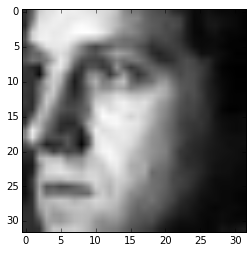

In [28]:
sigmal = 100.0
sigmap = 1000.0
sigmai = 10000.0
j = 600#1270#610#1000#500#540#545
print 'Image incomplete:', idx_inc[j]
plt.imshow( np.reshape(MF[idx_inc[j]],(32,32)).T, cmap='Greys_r' )

In [29]:
alphaG = np.dot(cnmf_kt_c.G, H4_i[:,j])
alphaW = np.dot(cnmf_kt_c.W, H4_i[:,j])
print alphaG.shape, MF_c.shape
preimG, trainErrorsG = kernel.preimage2(MF_c, alphaG, MF[idx_inc[j]],'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)
preimW, trainErrorsW = kernel.preimage2(MF_c, alphaW, MF[idx_inc[j]],'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)
preimG, trainErrorsG = kernel.preimage(MF_c, alphaG, 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)

(4158,) (4158, 1024)
Preimage  1 (4158, 1024) (1, 1024)
Preimage  2 (4158, 1024) (1, 1024)
Preimage  3 (4158, 1024) (1, 1024)
Preimage  4 (4158, 1024) (1, 1024)
Preimage  5 (4158, 1024) (1, 1024)
Preimage  6 (4158, 1024) (1, 1024)
Preimage  7 (4158, 1024) (1, 1024)
Preimage  8 (4158, 1024) (1, 1024)
Preimage  9 (4158, 1024) (1, 1024)
Preimage  1 (4158, 1024) (1, 1024)
Preimage  2 (4158, 1024) (1, 1024)
Preimage  3 (4158, 1024) (1, 1024)
Preimage  4 (4158, 1024) (1, 1024)
Preimage  5 (4158, 1024) (1, 1024)
Preimage  6 (4158, 1024) (1, 1024)
Preimage  7 (4158, 1024) (1, 1024)
Preimage  8 (4158, 1024) (1, 1024)
Preimage  9 (4158, 1024) (1, 1024)


In [35]:
alpha_bin = np.zeros((4158,1))
alpha_bin[idx_com[100]] = 0.8
alpha_bin[idx_com[101]] = 0.2
preim_bin, trainErrors_bin = kernel.preimage2(MF_c, alpha_bin, MF[idx_inc[j]],'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)

In [36]:
alpha_norm1 = (alphaW+abs(min(alphaW))) / sum(alphaW+abs(min(alphaW)))
preim_norm1, trainErrors_norm1 = kernel.preimage2(MF_c, alpha_norm1, MF[idx_inc[j]],'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)
print sum(alpha_norm1)

1.0


In [37]:
alpha_rnd = np.random.rand(4158)
preim_rnd, trainErrors_rnd = kernel.preimage2(MF_c, alpha_rnd, MF[idx_inc[j]],'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)

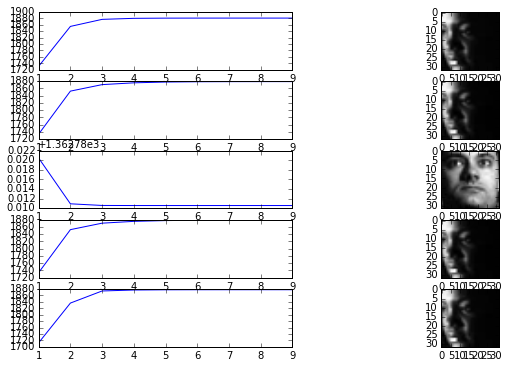

In [38]:
f, axarr = plt.subplots(5, 2)
axarr[0,0].plot(range(1,10),trainErrorsG) 
axarr[0,1].imshow( np.reshape(preimG,(32,32)).T, cmap='Greys_r' )
axarr[1,0].plot(range(1,10),trainErrorsW) 
axarr[1,1].imshow( np.reshape(preimW,(32,32)).T, cmap='Greys_r' )
axarr[2,0].plot(range(1,10),trainErrors_bin) 
axarr[2,1].imshow( np.reshape(preim_bin,(32,32)).T, cmap='Greys_r' )
axarr[3,0].plot(range(1,10),trainErrors_norm1) 
axarr[3,1].imshow( np.reshape(preim_norm1,(32,32)).T, cmap='Greys_r' )
axarr[4,0].plot(range(1,10),trainErrors_rnd) 
axarr[4,1].imshow( np.reshape(preim_rnd,(32,32)).T, cmap='Greys_r' )

f.set_size_inches(10,6)

Objective Function, from the kernel trick, $x^*$ minimize the function $\Xi$

$$\Xi = k(x,x)-2\sum_{i=1}^n\alpha k(x,x_i)$$

This expresion is derivated by the kernel trick from:
$$x^* = argmin_{x\in \mathcal{X}}||\sum_{i=1}^n \alpha_i\phi(x_i)-\phi(x)||^2_\mathcal{H}$$

In order to validate pre-image method we compute $\Xi_{x^*} - \Xi_{\hat{x}}$, where $\Xi_{x^*}$ is the objective function evaluated over the ground truth $x^*$ and $\Xi_{\hat{x}}$ is the objective function evaluated with the pre-image computed $\hat{x}$

In [39]:
alpha = alpha_norm1
preim = preim_norm1

In [54]:
proy = 0
for i in range(1,MF_c.shape[0]):
    proy += alpha[i]*kernel._get_kernel(MF_c[i], preimG, 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)
        
Psi = kernel._get_kernel(preimG, preimG, 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)-2*proy
#Psi = kernel._get_kernel(preim, preim, 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)-2*np.dot(alpha, kernel._get_kernel(MF_c, preim, 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2))

In [56]:
#preimG.shape
Psi

array([[-93.59099852]])

In [57]:
proy = 0
for i in range(1,MF_c.shape[0]):
    proy += alpha[i]*kernel._get_kernel(MF_c[i], MF[idx_inc[j]], 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)
    
Psi2 = kernel._get_kernel(MF[idx_inc[j]], MF[idx_inc[j]], 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)-2*proy
#Psi2 = kernel._get_kernel(MF[idx_inc[j]], MF[idx_inc[j]], 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)-2*np.dot(alpha,kernel._get_kernel(MF_c, MF[idx_inc[j]], 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2))

In [58]:
Psi2

array([[-14.89316306]])

In [100]:
sigmal = 100.0
sigmap = 1000.0
sigmai = 10000.0

#Pre-image reconstruction
num_atts = MF_ci.shape[1]
num_bases = 19
preim = np.copy(MF_ci)
tic = time.clock()#get start time
Psi_d = []
for j in range(len(idx_inc)):#546,
    print 'Compute pre-image for object',idx_inc[j]
    alpha = np.dot(cnmf_kt_c.G, H4_i[:,j]) #np.mean(cnmf_kg.H,0)
    #print alpha.shape
    #alpha = (alphaW+abs(min(alphaW))) / sum(alphaW+abs(min(alphaW)))
    preim[idx_inc[j]], trainErrorskl = kernel.preimage(MF_c, alpha, 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)
    proy = 0
    for i in range(1,MF_c.shape[0]):
        proy += alpha[i]*kernel._get_kernel(MF_c[i], preim, 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)
    Psi = np.asscalar(kernel._get_kernel(preim, preim, 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)-2*proy)
    #Psi = kernel._get_kernel(preim, preim, 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)-2*np.dot(alpha, kernel._get_kernel(MF_c, preim, 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2))
    #print Psi.shape
    proy = 0
    for i in range(1,MF_c.shape[0]):
        proy += alpha[i]*kernel._get_kernel(MF_c[i], MF[idx_inc[j]], 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)
    Psi2 = np.asscalar(kernel._get_kernel(MF[idx_inc[j]], MF[idx_inc[j]], 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)-2*proy)
    #Psi2 = kernel._get_kernel(MF[idx_inc[j]], MF[idx_inc[j]], 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2)-2*np.dot(alpha,kernel._get_kernel(MF_c, MF[idx_inc[j]], 'rbf', gamma=(2*sigmal)**-2+(2*sigmap)**-2+(2*sigmai)**-2))
    print Psi2 - Psi
    Psi_d.append(Psi2-Psi)
toc = time.clock()#get final time
print 'Time: ',toc - tic

Compute pre-image for object 4


ValueError: can only convert an array of size 1 to a Python scalar

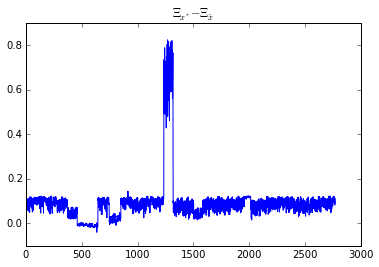

In [130]:
plt.plot(range(0,len(Psi_d)),Psi_d)
plt.title(r'$\Xi_{x^*} - \Xi_{\hat{x}}$')
#plt.plot([0, 0], [len(Psi_d), 0], 'r-')


In [131]:
print j

2771


In [18]:
import site; site.getsitepackages()

['/opt/anaconda/envs/mindlabenv/lib/python2.7/site-packages',
 '/opt/anaconda/envs/mindlabenv/lib/site-python']

<h3>2.4.2 Validating Factorization Method</h3>

In [216]:
from OKMF import OKMF #Online Kernel Matrix Factorization

In [3]:
#Using Synthetic data
mat_data = sio.loadmat('../datasets/sphere_data.mat')
sphere = np.squeeze(np.asarray([mat_data['x'],mat_data['y'],mat_data['z']])).T
sphere_label = np.squeeze(np.asarray(mat_data['c']))
print sphere.shape, sphere_label.shape

(867, 3) (867,)


In [4]:
#Compute without kernel
#Factorize
cnmf_sphere = CNMF(sphere,num_bases=3)
cnmf_sphere.factorize(niter=10,compute_err=False)
print np.linalg.norm(sphere - np.dot(cnmf_sphere.W,cnmf_sphere.H))/np.linalg.norm(sphere)

0.00130501948934


In [4]:
Ksphere_l = kernel._get_kernel(sphere, sphere,'linear')
cnmf_ksl = KCNMF(Ksphere_l,num_bases=10)
cnmf_ksl.factorize(niter=10)

AttributeError: KCNMF instance has no attribute 'converged'

In [217]:
Ksphere_l = kernel._get_kernel(sphere, sphere,'linear')
cnmf_ksl = CNMF(Ksphere_l,num_bases=10)
cnmf_ksl.factorize(niter=10)
print '(linear kernel) rse:',np.linalg.norm(Ksphere_l - np.dot(cnmf_ksl.W,cnmf_ksl.H))/np.linalg.norm(Ksphere_l)
sigma = 2**-2
Ksphere_g = kernel._get_kernel(sphere, sphere, 'rbf', gamma=(2*sigma)**-2)
cnmf_ksg = CNMF(Ksphere_g,num_bases=3)
cnmf_ksg.factorize(niter=10)
print '(rbf kernel) rse:',np.linalg.norm(Ksphere_g - np.dot(cnmf_ksl.W,cnmf_ksl.H))/np.linalg.norm(Ksphere_g)

(linear kernel) rse: 0.0913592692519
(rbf kernel) rse: 1.33095016306


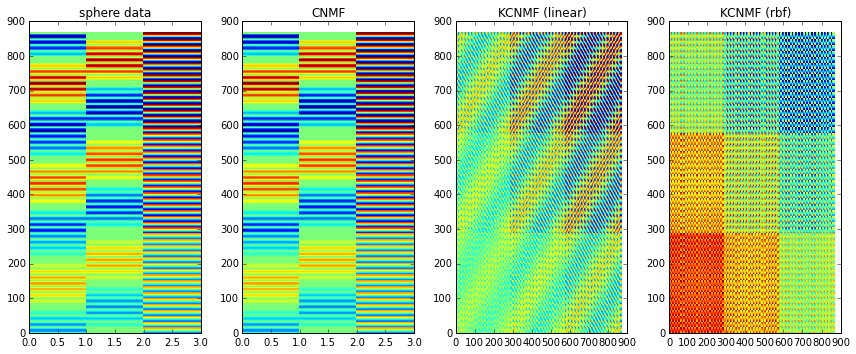

In [215]:
f, axarr = plt.subplots(1, 4)
axarr[0].pcolor(sphere)
axarr[0].set_title('sphere data')
axarr[1].pcolor(np.dot(cnmf_sphere.W,cnmf_sphere.H))
axarr[1].set_title('CNMF')
axarr[2].pcolor(np.dot(cnmf_ksl.W,cnmf_ksl.H))
axarr[2].set_title('KCNMF (linear)')
axarr[3].pcolor(np.dot(cnmf_ksg.W,cnmf_ksg.H))
axarr[3].set_title('KCNMF (rbf)')
f.set_size_inches(12,5)
f.tight_layout()

In [218]:
#Esteban algorithm 
Gamma = 0.01
Lambda = 0.0001
Alpha = 0.3
sigma = 2**-2
epochs = 3
ok = OKMF(867,3,10,epochs,Gamma,Lambda,Alpha,'rbf',gamma=sigma)
ok.fit(sphere,calculateErrors=True)

In [221]:
print '(rbf kernel) rse:',np.linalg.norm(Ksphere_g - np.dot(ok.W,ok.H))/np.linalg.norm(Ksphere_g)
print ok.trainErrors

(rbf kernel) rse: 1.46586501377
[ -1.55017125e+08   3.77164918e+10   3.77098285e+10   3.77031665e+10]


In [179]:
#Compute without kernel
#Factorize
cnmf_c = CNMF(MF_c,num_bases=19)
cnmf_c.factorize(niter=10)
print np.linalg.norm(MF_c - np.dot(cnmf_c.W,cnmf_c.H))/np.linalg.norm(MF_c)

0.329904555934


In [184]:
#linear kernel
KL = kernel._get_kernel(ML_c, ML_c,'linear')
cnmf_kl_c = CNMF(KL,num_bases=19)
cnmf_kl_c.factorize(niter=10)
print np.linalg.norm(KL - np.dot(cnmf_kl_c.W,cnmf_kl_c.H))/np.linalg.norm(KL)

0.000188500770376


In [180]:
lamb = 1e-10
bases = 19
sigmal = 100.0
sigmap = 1000.0
sigmai = 10000.0
_H1_i = np.zeros((bases, len(idx_inc)))
#H2_i = np.zeros((bases, len(idx_inc)))
#H3_i = np.zeros((bases, len(idx_inc)))
#H4_i = np.zeros((bases, len(idx_inc)))
k=0
#auxpi4 = np.linalg.inv(np.dot(cnmf_kt_c.W.T, cnmf_kt_c.G)+ lamb*np.identity(bases))
#auxpi3 = np.dot(cnmf_kt_c.W.T, np.linalg.inv( np.dot(cnmf_kt_c.W,cnmf_kt_c.W.T)+ lamb*np.identity(cnmf_kt_c.W.shape[0]) ) )
#auxpi2 = np.dot( np.dot(cnmf_kt_c.W.T, cnmf_kt_c.W)+ lamb*np.identity(bases),cnmf_kt_c.W.T )
auxpi1 = np.linalg.pinv(cnmf_c.W)
for j in idx_inc:    
    #H4_i[:,k] = np.squeeze(np.dot(auxpi4, np.dot(cnmf_kt_c.G.T, Ktx) ))
    #H3_i[:,k] = np.squeeze(np.dot(auxpi3,Ktx))
    #H2_i[:,k] = np.squeeze(np.dot(auxpi2,Ktx))
    _H1_i[:,k] = np.squeeze(np.dot(auxpi1,MF_ci[j]))
    k+=1

ValueError: shapes (19,4157) and (1024,) not aligned: 4157 (dim 1) != 1024 (dim 0)

<h3>2.4.3 Validation mode by mode</h3>

In [ ]:
#Validate fixing all except one mode


In [162]:
#fixing all modes except subject
MF_sm = MF[np.arange(35,MF.shape[0],11*21)]
#Kernel
sigma = 500
Ksm_g = kernel._get_kernel(MF_sm, MF_sm, 'rbf', gamma=(2*sigma)**-2)
#Factorize
cnmf_ksmg = KCNMF(Ksm_g,num_bases=30)
cnmf_ksmg.factorize(niter=10)
print '(rbf kernel) rse:',np.linalg.norm(Ksm_g - np.dot(cnmf_ksmg.W,cnmf_ksmg.H))/np.linalg.norm(Ksm_g)

(rbf kernel) rse: 0.171282310831


<matplotlib.colorbar.Colorbar instance at 0x7f3dc49adcf8>

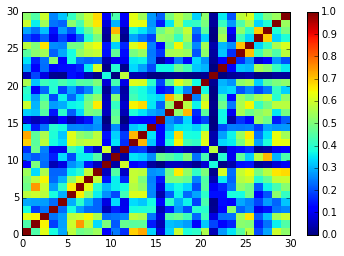

In [163]:
plt.pcolor(Ksm_g)
plt.colorbar()

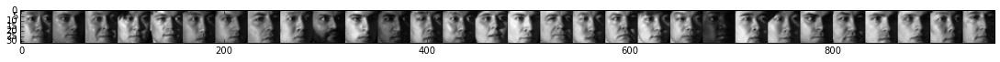

In [226]:
#Faces for Training
fig = plt.figure(figsize=(19,3))
plt.imshow( np.reshape(MF_sm,(960,32)).T, cmap='Greys_r' )


[   2  233  464  695  926 1157 1388 1619 1850 2081 2312 2543 2774 3005 3236
 3467 3698 3929 4160 4391 4622 4853 5084 5315 5546 5777 6008 6239 6470 6701]
Image incomplete: 29


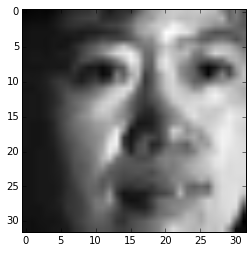

In [165]:
print np.arange(2,MF.shape[0],11*21)
inc = idx_inc[11]
print 'Image incomplete:',idx_inc[11]
plt.imshow( np.reshape(MF[inc],(32,32)).T, cmap='Greys_r' )

In [152]:
lamb = 1e-10
bases = 30
#sigma = 1e3
auxpi4 = np.linalg.inv(np.dot(cnmf_ksmg.W.T, cnmf_ksmg.G)+ lamb*np.identity(bases))
#auxpi3 = np.dot(cnmf_kt_c.W.T, np.linalg.inv( np.dot(cnmf_kt_c.W,cnmf_kt_c.W.T)+ lamb*np.identity(cnmf_kt_c.W.shape[0]) ) )
#auxpi2 = np.dot( np.dot(cnmf_kt_c.W.T, cnmf_kt_c.W)+ lamb*np.identity(bases),cnmf_kt_c.W.T )
#auxpi1 = np.linalg.pinv(cnmf_kt_c.W)
Ktx = kernel._get_kernel(MF_sm, MF_ci[inc], 'rbf', gamma=(2*sigma)**-2)
H4_i = np.squeeze(np.dot(auxpi4, np.dot(cnmf_ksmg.G.T, Ktx) ))
#H3_i[:,k] = np.squeeze(np.dot(auxpi3,Ktx))
#H2_i[:,k] = np.squeeze(np.dot(auxpi2,Ktx))
#H1_i[:,k] = np.squeeze(np.dot(auxpi1,Ktx))

In [90]:
#Pre-image reconstruction
num_atts = MF_sm.shape[1]
num_bases = 30

tic = time.clock()#get start time

alpha = np.dot(cnmf_ksmg.G, H4_i)
MFpreim_ci, trainErrorskl = kernel.preimage(MF_sm, alpha, 'rbf', gamma=(2*sigma)**-2)
    
toc = time.clock()#get final time
print 'Time: ',toc - tic

Time:  0.091465


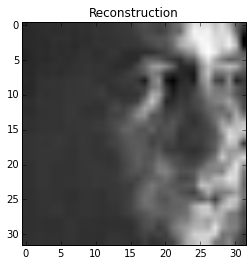

In [91]:
plt.imshow( np.reshape(MFpreim_ci,(32,32)).T, cmap='Greys_r' )
plt.title('Reconstruction')

[  29  260  491  722  953 1184 1415 1646 1877 2108 2339 2570 2801 3032 3263
 3494 3725 3956 4187 4418 4649 4880 5111 5342 5573 5804 6035 6266 6497 6728]
(30, 1024)


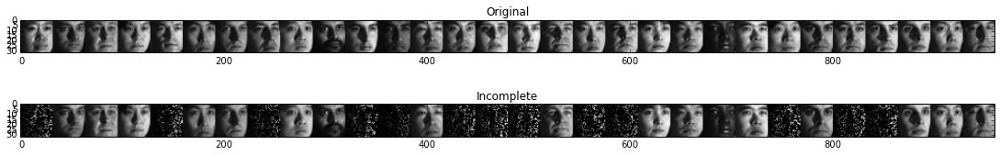

In [159]:
#Systhematic experiments (testing)
#incompletes = idx_inc[np.arange(0,20)]
incompletes = np.arange(29,MF.shape[0],11*21)
print incompletes
print MF[incompletes].shape

f, axarr = plt.subplots(2, 1)
axarr[0].imshow( np.reshape(MF[incompletes],(len(incompletes)*32,32)).T, cmap='Greys_r' )
axarr[0].set_title('Original')
axarr[1].imshow( np.reshape(MF_ci[incompletes],(len(incompletes)*32,32)).T, cmap='Greys_r' )
axarr[1].set_title('Incomplete')
f.set_size_inches(19,3)
#f.savefig('/home/rajaquep/outcomes/foo.png')

In [160]:
lamb = 1e-10
print 'Computing Hs...'
H4_i = np.zeros((bases, len(incompletes)))
for i in range(len(incompletes)):
    auxpi4 = np.linalg.inv(np.dot(cnmf_ksmg.W.T, cnmf_ksmg.G)+ lamb*np.identity(bases))
    Ktx = kernel._get_kernel(MF_sm, MF_ci[incompletes[i]], 'rbf', gamma=(2*sigma)**-2)
    H4_i[:,i] = np.squeeze(np.dot(auxpi4, np.dot(cnmf_ksmg.G.T, Ktx) ))
print '...Hs computed'
print 'Computing pre-image...'
MFpreim_ci = np.copy(MF_ci)
rse_f = []
for i in range(len(incompletes)):
    print 'Compute pre-image for object',incompletes[i]
    alpha = np.dot(cnmf_ksmg.G, H4_i[:,i]) #np.mean(cnmf_kg.H,0)        
    try:
        MFpreim_ci[incompletes[i]], trainErrorskl = kernel.preimage(MF_sm, alpha, 'rbf', gamma=(2*sigma)**-2)
        rse_f.append(np.linalg.norm(MF[incompletes[i]] - MFpreim_ci[incompletes[i]])/np.linalg.norm(MF[incompletes[i]]))
    except:
        print 'Problems computing preimage', i
        continue    
print '...pre-images computed'

Computing Hs...
...Hs computed
Computing pre-image...
Compute pre-image for object 29
Compute pre-image for object 260
Compute pre-image for object 491
Compute pre-image for object 722
Compute pre-image for object 953
Compute pre-image for object 1184
Compute pre-image for object 1415
Compute pre-image for object 1646
Compute pre-image for object 1877
Compute pre-image for object 2108
Compute pre-image for object 2339
Compute pre-image for object 2570
Compute pre-image for object 2801
Compute pre-image for object 3032
Compute pre-image for object 3263
Compute pre-image for object 3494
Compute pre-image for object 3725
Compute pre-image for object 3956
Compute pre-image for object 4187
Compute pre-image for object 4418
Compute pre-image for object 4649
Compute pre-image for object 4880
Compute pre-image for object 5111
Compute pre-image for object 5342
Compute pre-image for object 5573
Compute pre-image for object 5804
Compute pre-image for object 6035
Compute pre-image for object 6266


RSE 0.817204445067
[0.87332458391258594, 0.74896307594701772, 0.71666731649682192, 0.73025858412900502, 0.89935812385302893, 0.76595664437531064, 0.77986726107939619, 0.86344354667127787, 0.7155333613260475, 0.75484432881843289, 0.88525991351949618, 0.88322913242582857, 0.77864508276535671, 0.86667916137475198, 0.89149598110311767, 0.90531444527340144, 0.78996452734031819, 0.8741006136413868, 0.9024011950298767, 0.74300230134980072, 0.78687780467403146, 0.79692811041223754, 0.6888207405051231, 0.89619191277931198, 0.77755726883141629, 0.85946762986403746, 0.89621231985136296, 0.80706803543453065, 0.66844011917381774, 0.77284803688453796]


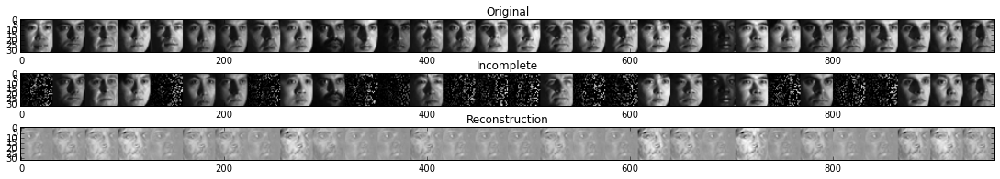

In [161]:
f, axarr = plt.subplots(3, 1)
axarr[0].imshow( np.reshape(MF[incompletes],(len(incompletes)*32,32)).T, cmap='Greys_r' )
axarr[0].set_title('Original')
axarr[1].imshow( np.reshape(MF_ci[incompletes],(len(incompletes)*32,32)).T, cmap='Greys_r' )
axarr[1].set_title('Incomplete')
axarr[2].imshow( np.reshape(MFpreim_ci[incompletes],(len(incompletes)*32,32)).T, cmap='Greys_r' )
axarr[2].set_title('Reconstruction')
f.set_size_inches(19,3)
f.savefig('/home/rajaquep/outcomes/foo.png')
print 'RSE', np.linalg.norm(MF[incompletes] - MFpreim_ci[incompletes])/np.linalg.norm(MF[incompletes])
print rse_f

Computing tensorial kernels

In [307]:
#kernels parameters
sigmas = 10.5
sigmal = 20.5 #100.0#1.6#
sigmap = 50.5#1000.0#4.5#
sigmai = 1000.0#10000.0#1000#

chooseks = 1
choosekl = 0
choosekp = 1
chooseki = 1

#objects: 330
Ks size: (330, 330)
Kp size: (330, 330)
Ki size: (330, 330)
(rbf kernel) rse: 0.195182957519


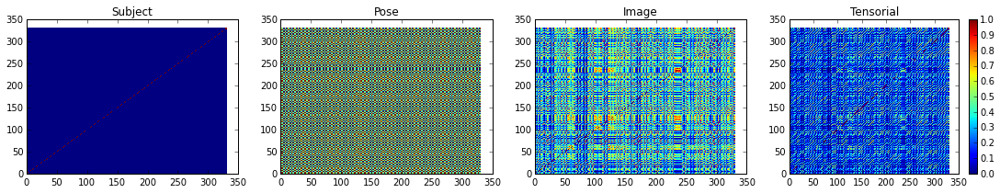

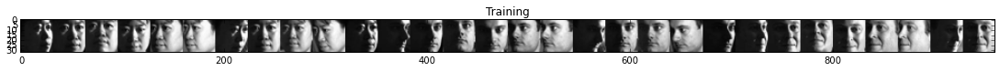

In [310]:
#30x11x21x1024
#completes = np.arange(35,MF.shape[0],11*21)#fixing all modes except subject
completes = np.arange(0,MF.shape[0],21)#fixing illumination
#completes = completes[range(30)]
MF_sm = MF[completes]
#MF_sm = MF
#Kernels
eq = 1
diff = 0.7
poses = [175, 95, 93, 88, 10, 5, 180, 90, 80, 2, 170]
illuminations = np.arange(1,22)
nobj = len(completes)
print '#objects:', nobj
Ksm_g = np.ones((nobj,nobj))

if chooseks == 1:
    #Kernel for subject
    #30x11x21x1024
    TS = np.zeros((30,11,21))
    for i in range(30):
        for j in range(len(poses)):
            for k in range(len(illuminations)):
                TS[i,j,k] = i

    MS = np.reshape(TS,(30*11*21,1))
    Ks = np.identity(nobj)*eq
    Ks[Ks==0] = diff
    print 'Ks size:', Ks.shape
    Ksm_g *= Ks
if choosekl == 1:
    #Illumination Kernel
    TL_ = np.repeat(np.array(np.arange(1,22), ndmin = 2),11,axis=0)
    TL = np.repeat(np.array(TL_,ndmin = 3),30,axis=0)
    ML = np.reshape(TL,(30*11*21,1))
    ML_c = ML[completes]
    Kl = kernel._get_kernel(ML_c, ML_c,'rbf', gamma=(2*sigmal)**-2)    
    print 'Kl size:', Kl.shape
    Ksm_g *= Kl
if choosekp == 1:
    TP_ = np.repeat(np.array([175, 95, 93, 88, 10, 5, 180, 90, 80, 2, 170], ndmin = 2),21,axis=0)
    TP = np.repeat(np.array(TP_.T,ndmin = 3),30,axis=0)
    MP = np.reshape(TP,(30*11*21,1))
    MP_c = MP[completes]
    Kp = kernel._get_kernel(MP_c, MP_c,'rbf', gamma=(2*sigmap)**-2)
    print 'Kp size:', Kp.shape
    Ksm_g *= Kp
if chooseki == 1:    
    #image kernel    
    Ki = kernel._get_kernel(MF_sm, MF_sm, 'rbf', gamma=(2*sigmai)**-2)
    print 'Ki size:', Ki.shape
    Ksm_g *= Ki
#tensorial kernel
#Ksm_g = Ks*Ki
#Ksm_g = Ks+Ki
#Factorize
cnmf_ksmg = KCNMF(Ksm_g,num_bases=30)
cnmf_ksmg.factorize(niter=10)
print '(rbf kernel) rse:',np.linalg.norm(Ksm_g - np.dot(cnmf_ksmg.W,cnmf_ksmg.H))/np.linalg.norm(Ksm_g)
f, axarr = plt.subplots(1, 1+chooseks+choosekl+choosekp+chooseki)
i=0
if chooseks == 1:
    axarr[i].pcolor(Ks)
    axarr[i].set_title('Subject')
    i+=1
if choosekl == 1:    
    axarr[i].pcolor(Ki)
    axarr[i].set_title('Image')
    i+=1
if choosekp == 1:    
    axarr[i].pcolor(Kp)
    axarr[i].set_title('Pose')
    i+=1
if chooseki == 1:    
    axarr[i].pcolor(Ki)
    axarr[i].set_title('Image')
    i+=1
axarr[i].pcolor(Ksm_g)
axarr[i].set_title('Tensorial')
    
f.set_size_inches(19,3)
plt.pcolor(Ksm_g)
plt.colorbar()
#Faces for Training
fig = plt.figure(figsize=(19,3))
plt.imshow( np.reshape(MF_sm[range(30)],(30*32,32)).T, cmap='Greys_r' )
plt.title('Training')


[  1  22  43  64  85 106 127 148 169 190 211 232 253 274 295 316 337 358
 379 400 421 442 463 484 505 526 547 568 589 610]
(30, 1024)


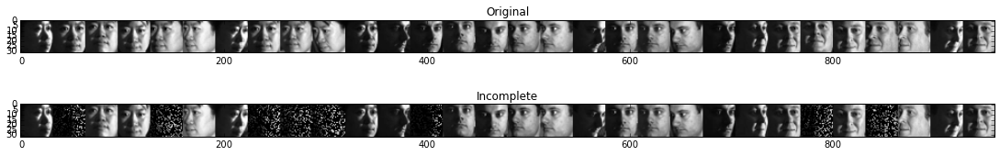

In [288]:
#Systhematic experiments (testing)
#incompletes = idx_inc[np.arange(0,30)]
#incompletes = np.arange(29,MF.shape[0],11*21)
incompletes = np.arange(1,MF.shape[0],21)#fixing illumination
incompletes = incompletes[range(30)]
print incompletes
print MF[incompletes].shape

f, axarr = plt.subplots(2, 1)
axarr[0].imshow( np.reshape(MF[incompletes],(len(incompletes)*32,32)).T, cmap='Greys_r' )
axarr[0].set_title('Original')
axarr[1].imshow( np.reshape(MF_ci[incompletes],(len(incompletes)*32,32)).T, cmap='Greys_r' )
axarr[1].set_title('Incomplete')
f.set_size_inches(19,3)
#f.savefig('/home/rajaquep/outcomes/foo.png')

In [322]:
lamb = 1e-10
print 'Computing Hs...'
H4_i = np.zeros((bases, len(incompletes)))
for i in range(len(incompletes)):
    auxpi4 = np.linalg.inv(np.dot(cnmf_ksmg.W.T, cnmf_ksmg.G)+ lamb*np.identity(bases))
    Ktx = np.ones((nobj,1))
    gamma_t = 0 #preimage
    if chooseks == 1:
        Ksx = np.zeros((nobj,1))
        for j in range(nobj):
            if MS[incompletes[i]]==MS[completes[j]]: Ksx[j] = eq
            else: Ksx[j] = diff    
        Ktx *= Ksx
        #gamma_t += (2*sigmas)**-2#preimage
    if choosekl == 1:
        Klx = kernel._get_kernel(ML_c, ML[i],'rbf', gamma=(2*sigmal)**-2)
        Ktx *= Klx
        gamma_t += (2*sigmal)**-2#preimage
    if choosekp == 1:
        Kpx = kernel._get_kernel(MP_c, MP[i],'rbf', gamma=(2*sigmap)**-2)
        Ktx *= Kpx
        gamma_t += (2*sigmap)**-2#preimage
    if chooseki == 1:
        Kix = kernel._get_kernel(MF_sm, MF_ci[incompletes[i]], 'rbf', gamma=(2*sigmai)**-2)
        Ktx *= Kix
        gamma_t += (2*sigmai)**-2#preimage
    #Ktx = Ksx+Kix    
    H4_i[:,i] = np.squeeze(np.dot(auxpi4, np.dot(cnmf_ksmg.G.T, Ktx) ))
print '...Hs computed'
print 'Computing pre-image...'
MFpreim_ci = np.copy(MF_ci)
rse_f = []
for i in range(len(incompletes)):
    print 'Compute pre-image for object',incompletes[i]
    alpha = np.dot(cnmf_ksmg.G, H4_i[:,i]) #np.mean(cnmf_kg.H,0)        
    try:        
        #MFpreim_ci[incompletes[i]], trainErrorskl = kernel.preimage(MF_sm, alpha, 'rbf', gamma=(2*sigmas)**-2+(2*sigmai)**-2)
        MFpreim_ci[incompletes[i]], trainErrorskl = kernel.preimage(MF_sm, alpha, 'rbf', gamma=gamma_t)
        rse_f.append(np.linalg.norm(MF[incompletes[i]] - MFpreim_ci[incompletes[i]])/np.linalg.norm(MF[incompletes[i]]))
    except:
        print 'Problems computing preimage', i
        continue    
print '...pre-images computed'

Computing Hs...
...Hs computed
Computing pre-image...
Compute pre-image for object 1
Compute pre-image for object 22
Compute pre-image for object 43
Compute pre-image for object 64
Compute pre-image for object 85
Compute pre-image for object 106
Compute pre-image for object 127
Compute pre-image for object 148
Compute pre-image for object 169
Compute pre-image for object 190
Compute pre-image for object 211
Compute pre-image for object 232
Compute pre-image for object 253
Compute pre-image for object 274
Compute pre-image for object 295
Compute pre-image for object 316
Compute pre-image for object 337
Compute pre-image for object 358
Compute pre-image for object 379
Compute pre-image for object 400
Compute pre-image for object 421
Compute pre-image for object 442
Compute pre-image for object 463
Compute pre-image for object 484
Compute pre-image for object 505
Compute pre-image for object 526
Compute pre-image for object 547
Compute pre-image for object 568
Compute pre-image for object

RSE 0.867584357255
[0.7424354788705223, 0.82513989980967484, 0.86355538472622351, 0.86997708176346422, 0.90036756864434087, 0.92646323922739782, 0.82013679838145237, 0.85315802442826616, 0.88991596699523445, 0.92277517993493507, 0.75662856159690628, 0.74290273877048796, 0.79066802178422291, 0.82269761106553263, 0.84458781937118643, 0.89820020494438824, 0.91937012449384403, 0.79868527477917228, 0.82946334196852478, 0.86107907552109009, 0.92645929418468143, 0.6739918047007607, 0.70236408037844145, 0.82277470762806948, 0.84719409357957121, 0.85481304300849414, 0.8889644878181463, 0.92427319675181452, 0.80537675775206685, 0.84596095879112432]


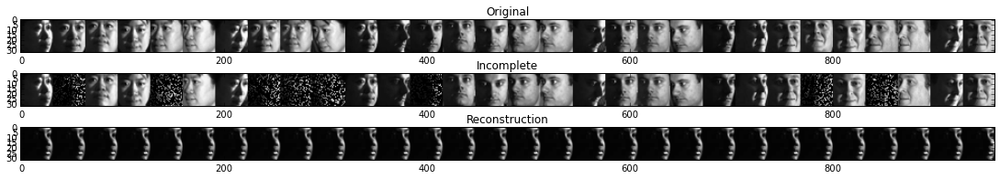

In [323]:
f, axarr = plt.subplots(3, 1)
axarr[0].imshow( np.reshape(MF[incompletes],(len(incompletes)*32,32)).T, cmap='Greys_r' )
axarr[0].set_title('Original')
axarr[1].imshow( np.reshape(MF_ci[incompletes],(len(incompletes)*32,32)).T, cmap='Greys_r' )
axarr[1].set_title('Incomplete')
axarr[2].imshow( np.reshape(MFpreim_ci[incompletes],(len(incompletes)*32,32)).T, cmap='Greys_r' )
axarr[2].set_title('Reconstruction')
f.set_size_inches(19,3)
f.savefig('/home/rajaquep/outcomes/foo.png')
print 'RSE', np.linalg.norm(MF[incompletes] - MFpreim_ci[incompletes])/np.linalg.norm(MF[incompletes])
print rse_f

In [120]:
#Using Esteban's algorithm for kernel factorization
#Esteban algorithm 
Gamma = 0.01
Lambda = 0.0001
Alpha = 0.3
sigma = 2**-2
epochs = 3
ok = OKMF(867,3,10,epochs,Gamma,Lambda,Alpha,'rbf',gamma=sigma)
ok.fit(sphere,calculateErrors=True)

In [ ]:
#Systematic experiments
import test_kcnmf
test_kcnmf.test_cmu2(MF, sigmal = 100.0, sigmap = 1000.0, sigmai = 10000.0, bases = 20, type_h = 4)

In [136]:
#Read Input
lines2 = np.loadtxt("/home/rajaquep/outcomes/cmu_faces_11nov2016.csv", comments="//", delimiter=";", skiprows=1, usecols=(1,2,3,4,5,6), unpack=False)

In [137]:
missing_rates = [0.1, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.92, 0.94, 0.96, 0.98]

rse_cmu2_min = []
for i in range(len(missing_rates)):
    rse_cmu2_min.append( np.min(lines2[np.arange(i,lines2.shape[0],11),4]) )

In [138]:
#rse STDC
rse_stdc = [.1282, .1878, .2469, .2652, .3087, .2177, .4852, .6168, .7513, .8587, .9324]

In [139]:
#Read Input approach 1 to compare
lines = np.loadtxt("/home/rajaquep/outcomes/cmu_faces_12sep2016.csv", comments="//", delimiter=";", skiprows=1, usecols=(1,2,3,4,5), unpack=False)
rse_rbf = lines[np.arange(1,lines.shape[0],3),4]#rbf kernel
rse_rbf_mean = []
for i in range(len(missing_rates)):
    rse_rbf_mean.append( np.min(rse_rbf[np.arange(i,rse_rbf.shape[0],11)]) )

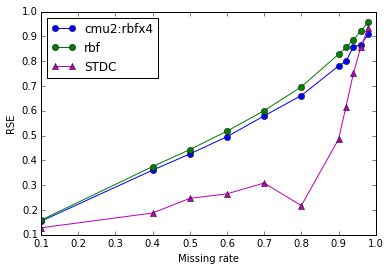

In [140]:
plt.plot(missing_rates,rse_cmu2_min,'-ob',label='cmu2:rbfx4')
plt.plot(missing_rates,rse_rbf_mean,'-og',label='rbf')
#plt.plot(missing_rates,rse_linxrbf_mean,'-or',label='linxrbf')
#plt.plot(missing_rates,rse_softxlinxrbf_mean,'-oy',label='softxlinxrbf')
plt.plot(missing_rates,rse_stdc,'-^m',label='STDC')
plt.legend(loc=2)
plt.ylabel('RSE')
plt.xlabel('Missing rate')